In [5]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
import anndata

from RnaVeloDataset import RnaVeloDataset
from symsimDataset import SymsimBifur, SymsimTree, SymsimBranch, SymsimLinear, SymsimCycle, SymsimTrifur
from symsimDatasetTest import SymsimTreeNoisy, SymsimBifurNoisy, SymsimLinearNoisy
from realDataset import forebrainDataset, chromaffinDataset, forebrainDataset_large, peDataset, peDataset_large, paulDataset

from torch_geometric.data import DataLoader, Data
from model.mymodel import MyModel, GraphSAGEModel, FCModel, veloModel, DiffusionModel
import utils
import backbone

In [6]:
# dataBifur = SymsimBifur()
dataTree = SymsimTree()
datalinear = SymsimLinear()
dataDyngen = RnaVeloDataset()
forebrain = forebrainDataset()
forebrain_large = forebrainDataset_large()
chromaffin = chromaffinDataset()
pancreas = peDataset()
pancreas_large = peDataset_large()
paul = paulDataset()

dataTreeNoisy = SymsimTreeNoisy()


In [7]:
t = np.arange(1,10)

# dataset for validation
val_mask = [10*i for i in range(4)]

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
Path = "./trained_model/GraphSAGE_256_128_2_2_8965.pt"

# model = DiffusionModel(dataTree.num_features, hidden1 = 256, hidden2 = 128, max_diffusion = 6, include_reversed = True, device = device, dropout1=0.2, dropout2=0.2).to(device)
model = GraphSAGEModel(dataTree.num_features, device, h1 = 256, h2 = 128, dropout1 = 0.2, dropout2 = 0.2).to(device)
model.load_state_dict(torch.load(Path, map_location=torch.device('cpu')))
model.eval()

GraphSAGEModel(
  (conv1): GraphConvolutionSage (299 -> 256)
  (conv2): GraphConvolutionSage (256 -> 128)
  (lin): Linear(in_features=128, out_features=1, bias=True)
)

In [11]:
Path = "./trained_model/Diffusion_299_256_128_3_2_2_9296.pt"
model_diff = DiffusionModel(dataTree.num_features, hidden1 = 256, hidden2 = 128, max_diffusion = 3, include_reversed = True, device = device, dropout1=0.2, dropout2=0.2).to(device)
model_diff.load_state_dict(torch.load(Path, map_location=torch.device('cpu')))
model_diff.eval()

DiffusionModel(
  (conv1): GraphDiffusion (299 -> 256)
  (conv2): GraphDiffusion (256 -> 128)
  (lin): Linear(in_features=128, out_features=1, bias=True)
)

In [12]:
Path = "./trained_model/Linear_299_256_128_2_2.pt"
# model = DiffusionModel(dataTree.num_features, hidden1 = 256, hidden2 = 128, max_diffusion = 6, include_reversed = True, device = device, dropout1=0.2, dropout2=0.2).to(device)
model_fc = FCModel(dataTree.num_features, device, hidden1=256, hidden2=128, dropout1=0.2, dropout2=0.2).to(device)
model_fc.load_state_dict(torch.load(Path, map_location=torch.device('cpu')))
model_fc.eval()

FCModel(
  (lin1): Linear(in_features=299, out_features=256, bias=True)
  (lin2): Linear(in_features=256, out_features=128, bias=True)
  (lin3): Linear(in_features=128, out_features=1, bias=True)
)

In [13]:
X = np.concatenate((datalinear[9].x, dataTree[9].x), axis=0)
# X = pca.fit_transform(X)
y = np.concatenate((datalinear[9].y, dataTree[9].y), axis=0)
from sklearn.kernel_ridge import KernelRidge
clf = KernelRidge(alpha=0.1)
clf.fit(X, y)

KernelRidge(alpha=0.1, coef0=1, degree=3, gamma=None, kernel='linear',
            kernel_params=None)

In [14]:
def visualize_pt(ax, pt, model, label, X_pca, fig):
    loss = "  Pearson Correlation: " + str(utils.pearson(pt, label))[:5] if len(label) else ''
    pred_sorted = sorted(pt)
    pt = [pred_sorted.index(i) for i in pt]

    pseudo_visual = ax.scatter(X_pca[:,0], X_pca[:,1], c = pt, cmap = plt.get_cmap('gnuplot'))
    fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax)    
    ax.set_title(model + loss)

def scatter(data, title, true_label=True, umap=False):

    X_pca = utils.pca_op(data.x.detach().numpy(), standardize=False)
    if umap:
        X_pca = data.adata.obsm['X_umap']

    if true_label:
        label = data.y.cpu().numpy()[:,0]
        fig = plt.figure(figsize = (36, 5))
        ax1,ax2,ax3,ax4,ax5,ax6 = fig.subplots(1,6)
        ax6.set_title('true label')
        pseudo_visual = ax6.scatter(X_pca[:,0], X_pca[:,1], c = label, cmap = plt.get_cmap('gnuplot'))
        fig.colorbar(pseudo_visual,fraction=0.046, pad=0.04, ax = ax6)
    else:
        label = []
        fig = plt.figure(figsize = (30, 5))
        ax1,ax2,ax3,ax4,ax5 = fig.subplots(1,5)

    fig.suptitle(title, fontsize=20)
    
    # Ridge
    pt = clf.predict(data.x)
    visualize_pt(ax1, pt, "ridge regression", label, X_pca, fig)

    # GraphSAGE
    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    visualize_pt(ax2, pt.detach().cpu().numpy().squeeze(), "GraphSAGE", label, X_pca, fig)

    # MLP
    pt, _, _ = model_fc(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    visualize_pt(ax3, pt.detach().cpu().numpy().squeeze(), "MLP", label, X_pca, fig)

    # DiffusionNN
    pt, _, _ = model_diff(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    visualize_pt(ax4, pt.detach().cpu().numpy().squeeze(), "DiffusionNN", label, X_pca, fig)

    # dpt
    pt = data.y_vdpt[0][0]
    visualize_pt(ax5, pt, "dpt", label, X_pca, fig)

    # edges = data.edge_index.cpu().numpy()
    # for i in range(edges.shape[1]):
    #     ax4.plot(X_pca[edges[:,i]][:,0], X_pca[edges[:,i]][:,1])

# Noiseless dataset

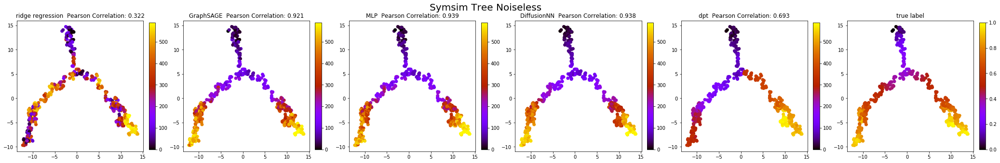

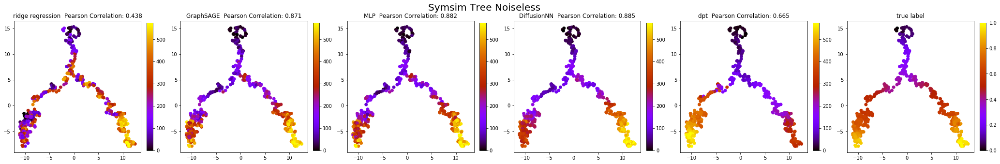

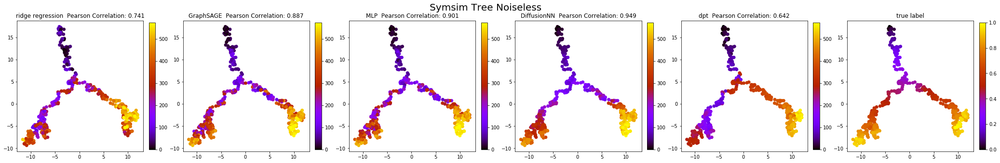

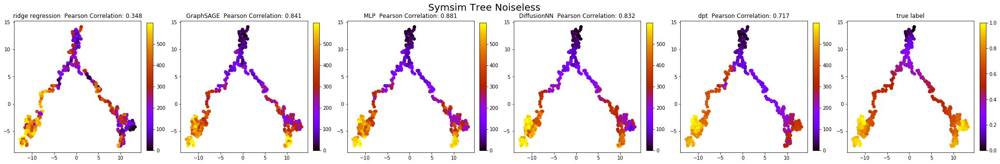

In [18]:
for data in DataLoader(dataTree[val_mask]):
    scatter(data, title='Symsim Tree Noiseless')

# Noisy dataset

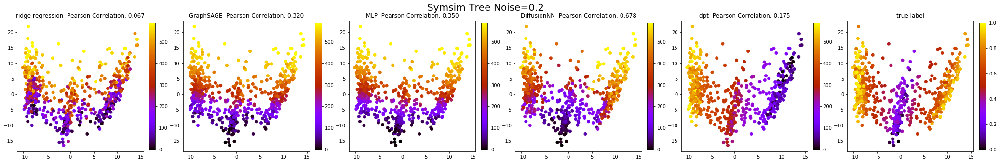

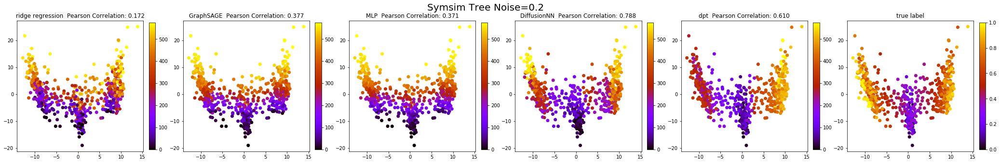

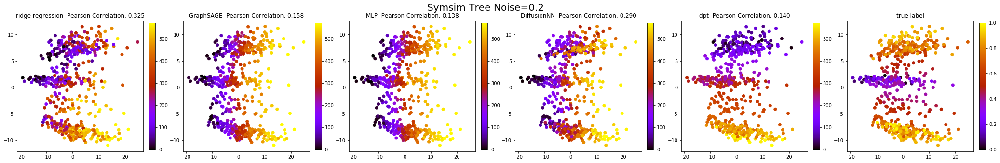

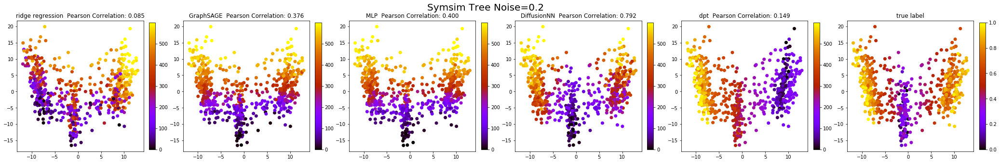

In [19]:
for data in DataLoader(dataTreeNoisy[val_mask]):
    scatter(data, title='Symsim Tree Noise=0.2')

# Dyngen dataset

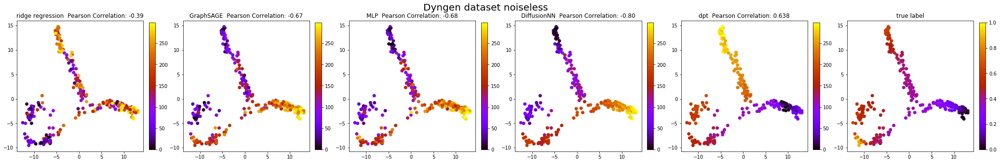

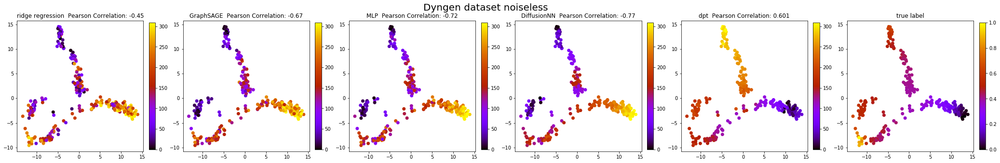

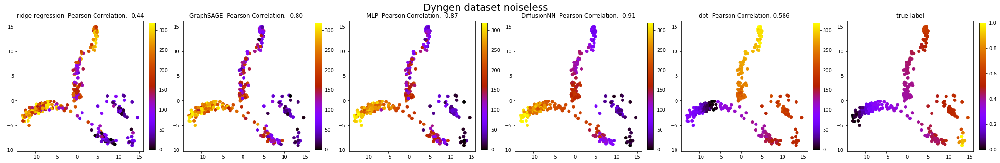

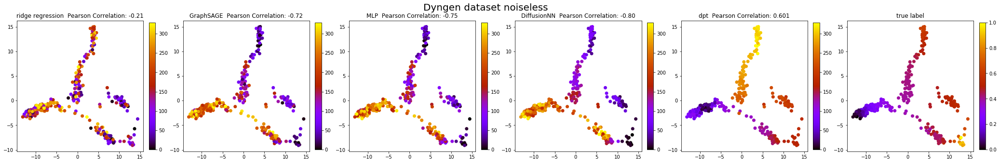

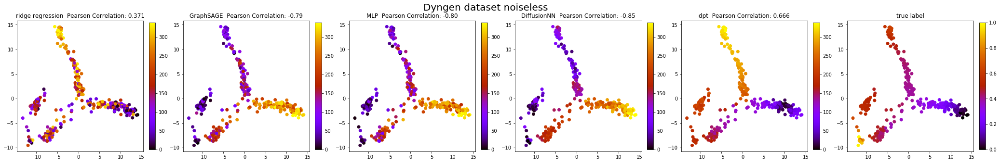

In [20]:
for data in DataLoader(dataDyngen[:5]):
    scatter(data, title='Dyngen dataset noiseless')

# Real dataset

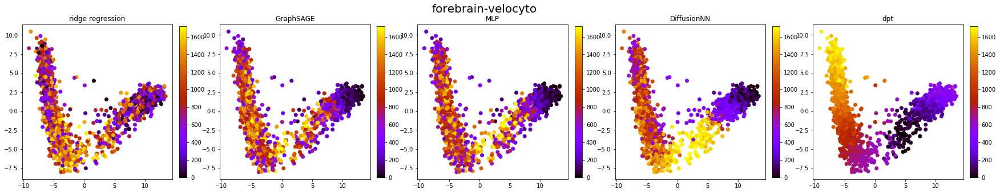

In [21]:
for data in DataLoader(forebrain):
    scatter(data, title='forebrain-velocyto', true_label=False)

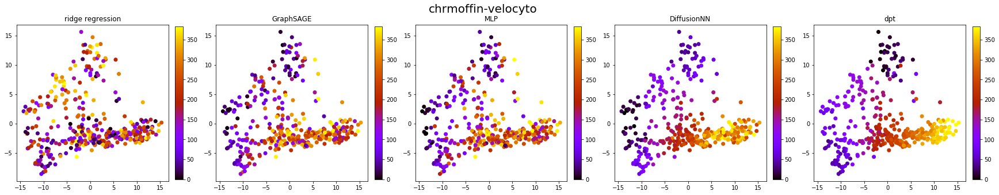

In [22]:
for data in DataLoader(chromaffin):
    scatter(data, title='chrmoffin-velocyto', true_label=False)


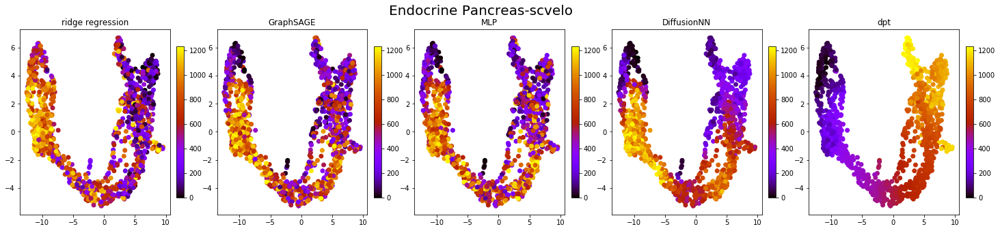

In [23]:
for data in DataLoader(pancreas):
    adata = anndata.read_h5ad('./data/real_dataset/endocrinogenesis_day15.h5ad')  

    adata = adata[::3]
    X_pca = adata.obsm['X_umap']

    fig = plt.figure(figsize = (25, 5))
    ax1,ax2,ax3,ax4,ax5 = fig.subplots(1,5)

    fig.suptitle('Endocrine Pancreas-scvelo', fontsize=20)
    
    # Ridge
    pt = clf.predict(data.x)
    visualize_pt(ax1, pt, "ridge regression", [], X_pca, fig)

    # GraphSAGE
    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().squeeze()
    visualize_pt(ax2, pt, "GraphSAGE", [], X_pca, fig) 

    # MLP
    pt, _, _ = model_fc(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().squeeze()
    visualize_pt(ax3, pt, "MLP", [], X_pca, fig)

    # DiffusionNN
    pt, _, _ = model_diff(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    visualize_pt(ax4, pt.detach().cpu().numpy().squeeze(), "DiffusionNN", [], X_pca, fig)

    #dpt
    pt = data.y_vdpt[0][0]
    visualize_pt(ax5, pt, "dpt", [], X_pca, fig)



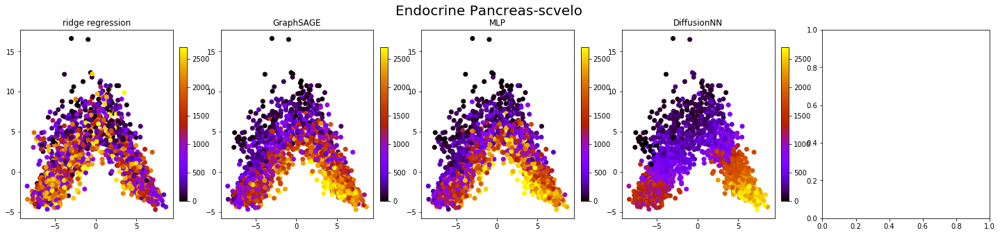

In [24]:
for data in DataLoader(paul):
    X_pca = utils.pca_op(data.x.detach().numpy(), standardize=False)

    fig = plt.figure(figsize = (25, 5))
    ax1,ax2,ax3,ax4,ax5 = fig.subplots(1,5)

    fig.suptitle('Endocrine Pancreas-scvelo', fontsize=20)
    
    # Ridge
    pt = clf.predict(data.x)
    visualize_pt(ax1, pt, "ridge regression", [], X_pca, fig)

    # GraphSAGE
    pt, _, _ = model(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().squeeze()
    visualize_pt(ax2, pt, "GraphSAGE", [], X_pca, fig) 

    # MLP
    pt, _, _ = model_fc(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    pt = pt.detach().cpu().numpy().squeeze()
    visualize_pt(ax3, pt, "MLP", [], X_pca, fig)

    # DiffusionNN
    pt, _, _ = model_diff(data.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
    visualize_pt(ax4, pt.detach().cpu().numpy().squeeze(), "DiffusionNN", [], X_pca, fig)

    #dpt
    # pt = data.y_vdpt[0][0]
    # visualize_pt(ax5, pt, "dpt", [], X_pca, fig)